Ref: https://github.com/ageron/handson-ml3/blob/main/02_end_to_end_machine_learning_project.ipynb

In [1]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

About this file

    longitude: A measure of how far west a house is; a higher value is farther west
    latitude: A measure of how far north a house is; a higher value is farther north
    housingMedianAge: Median age of a house within a block; a lower number is a newer building
    totalRooms: Total number of rooms within a block
    totalBedrooms: Total number of bedrooms within a block
    population: Total number of people residing within a block
    households: Total number of households, a group of people residing within a home unit, for a block
    medianIncome: Median income for households within a block of houses (measured in tens of thousands of US Dollars)
    medianHouseValue: Median house value for households within a block (measured in US Dollars)
    oceanProximity: Location of the house w.r.t ocean/sea



In [21]:
import pandas as pd
import numpy as np

df = pd.read_csv('housing.csv')
df.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY


In [5]:
df.dtypes

longitude             float64
latitude              float64
housing_median_age     object
total_rooms           float64
total_bedrooms        float64
population            float64
households            float64
median_income         float64
median_house_value     object
ocean_proximity        object
dtype: object

In [6]:
df['housing_median_age'].astype(float)

ValueError: could not convert string to float: '52.0"""'

In [11]:
df['housing_median_age'] = pd.to_numeric(df['housing_median_age'], errors='coerce')
df[df['housing_median_age'].isnull()]

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
14,-122.26,37.85,NaN,2643.0,626.0,1212.0,620.0,1.9167,159200.0,NEAR BAY


In [12]:
value = '52.0"""'
float(value)

ValueError: could not convert string to float: '52.0"""'

In [16]:
def convert_to_float(value):
    try:
        return float(value.replace('"','').replace("'",''))
    except:
        return np.nan

convert_to_float(value)
convert_to_float('??""')

52.0

nan

In [22]:
df['housing_median_age'] = df['housing_median_age'].apply(lambda row: convert_to_float(row))
df[df['housing_median_age'].isnull()]

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity


In [24]:
a = pd.to_numeric(df['median_house_value'], errors='coerce')

In [31]:
a[a.isnull()]
df.iloc[5810]


63     NaN
5052   NaN
5419   NaN
5810   NaN
Name: median_house_value, dtype: float64

longitude               -121.93
latitude                  37.71
housing_median_age         26.0
total_rooms              4822.0
total_bedrooms            845.0
population               2288.0
households                805.0
median_income            4.2281
median_house_value           ??
ocean_proximity       <1H OCEAN
Name: 5810, dtype: object

In [32]:
df = pd.read_csv('housing2.csv')
df.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY


In [35]:
df['median_income'].max()
df['median_income'].min()

15.0001

0.4999

In [36]:
from ydata_profiling import ProfileReport
profile = ProfileReport(df, title="Profiling Report")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<Axes: xlabel='income_cat'>

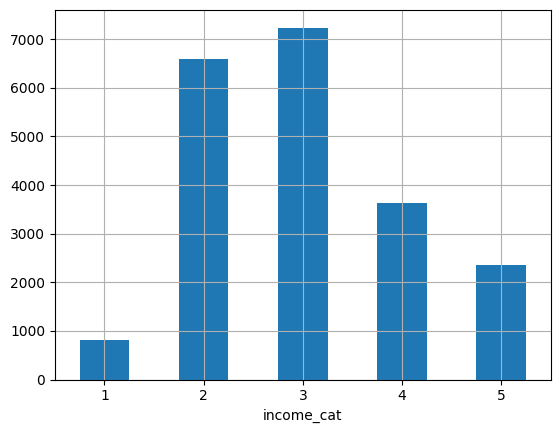

In [37]:
import matplotlib.pyplot as plt
%matplotlib inline
# df = pd.read_csv('housing.csv')
df["income_cat"] = pd.cut(df["median_income"],
                               bins=[0., 1.5, 3.0, 4.5, 6., np.inf],
                               labels=[1, 2, 3, 4, 5])

df["income_cat"].value_counts().sort_index().plot.bar(rot=0, grid=True)
plt.show()


In [39]:
from sklearn.model_selection import train_test_split
train, test = train_test_split(df, test_size=0.3, stratify=df['income_cat'], random_state=20240417)

In [40]:
## Check stratification
train['income_cat'].value_counts() / len(train['income_cat'])
test['income_cat'].value_counts() / len(test['income_cat'])

income_cat
3    0.350568
2    0.318868
4    0.176287
5    0.114480
1    0.039798
Name: count, dtype: float64

income_cat
3    0.350614
2    0.318798
4    0.176357
5    0.114341
1    0.039890
Name: count, dtype: float64

<Axes: xlabel='longitude', ylabel='latitude'>

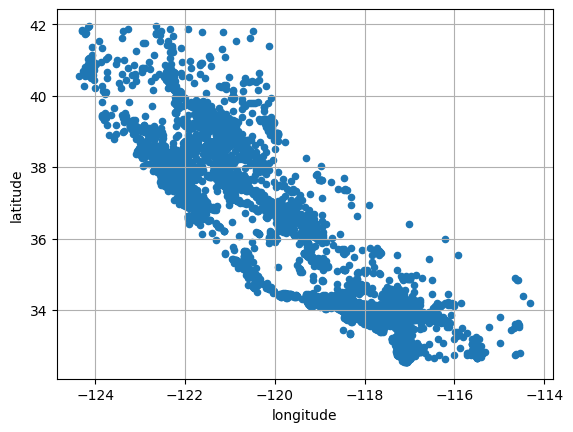

In [41]:
train.plot(kind="scatter", x="longitude", y="latitude", grid=True)
plt.show()

<Axes: xlabel='longitude', ylabel='latitude'>

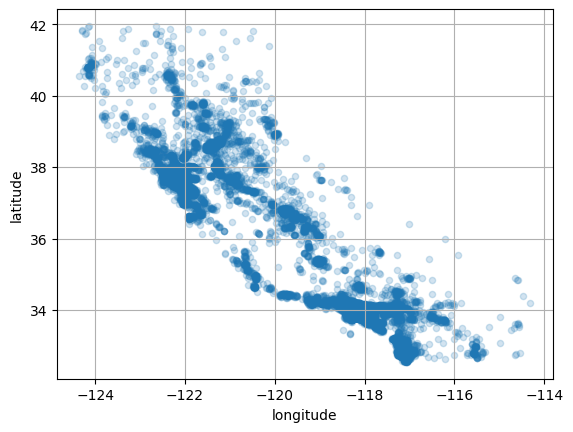

In [43]:
train.plot(kind="scatter", x="longitude", y="latitude", grid=True, alpha=0.2) # use alpha to see high density data points
plt.show()

<Axes: xlabel='longitude', ylabel='latitude'>

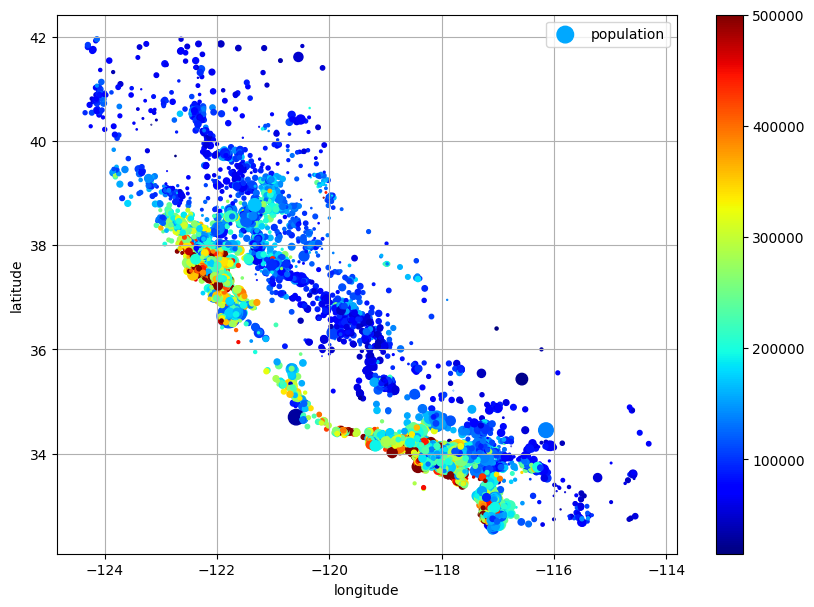

In [45]:
train.plot(kind="scatter", x="longitude", y="latitude", grid=True,
             s=train["population"] / 100, label="population", # s == radius; use radius to visualize population
             c=train["median_house_value"].to_list(), cmap="jet", colorbar=True, # c == color; use color to visualize price
             legend=True, sharex=False, figsize=(10, 7))
plt.show()

In [46]:
from ydata_profiling import ProfileReport
profile = ProfileReport(train, title="Profiling Report")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [47]:
corr_matrix = df.corr(numeric_only=True)
corr_matrix["median_house_value"].sort_values(ascending=False)

median_house_value    1.000000
median_income         0.688075
total_rooms           0.134153
housing_median_age    0.105623
households            0.065843
total_bedrooms        0.049686
population           -0.024650
longitude            -0.045967
latitude             -0.144160
Name: median_house_value, dtype: float64

Text(0.5, 1.0, 'Correlation Plot')

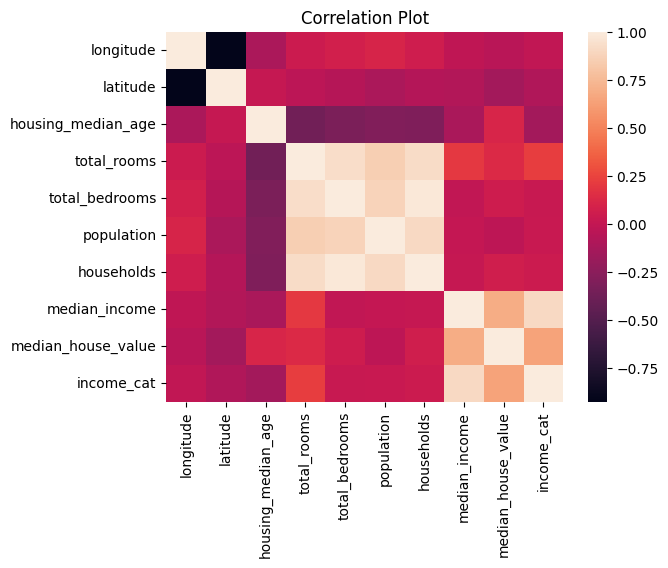

In [48]:
import seaborn as sns 
sns.heatmap(df.select_dtypes(exclude='object').corr()).set_title('Correlation Plot')


Text(0.5, 1.0, 'Ocean Proximity Analysis for Median House Value')

<Axes: title={'center': 'Ocean Proximity Analysis for Median House Value'}, xlabel='ocean_proximity', ylabel='median_house_value'>

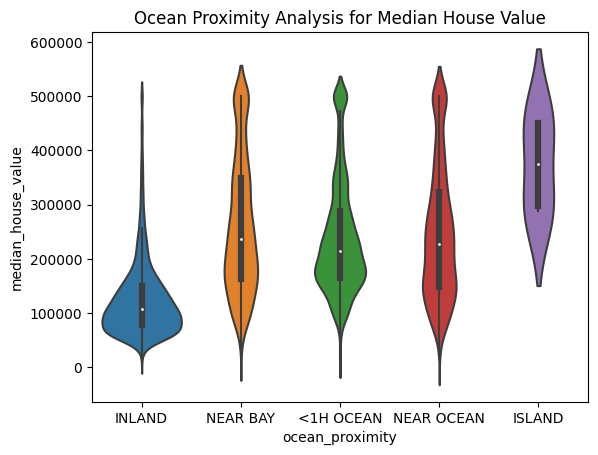

In [49]:
plt.title('Ocean Proximity Analysis for Median House Value')
sns.violinplot(x='ocean_proximity', y='median_house_value', data=train)
plt.show()

In [50]:
df["rooms_per_house"] = df["total_rooms"] / df["households"]
df["bedrooms_ratio"] = df["total_bedrooms"] / df["total_rooms"]
df["people_per_house"] = df["population"] / df["households"]
corr_matrix = df.corr(numeric_only=True)
corr_matrix["median_house_value"].sort_values(ascending=False)

median_house_value    1.000000
median_income         0.688075
rooms_per_house       0.151948
total_rooms           0.134153
housing_median_age    0.105623
households            0.065843
total_bedrooms        0.049686
people_per_house     -0.023737
population           -0.024650
longitude            -0.045967
latitude             -0.144160
bedrooms_ratio       -0.255880
Name: median_house_value, dtype: float64

In [1]:
df.dtypes

NameError: name 'df' is not defined

Text(0.5, 1.0, 'Correlation Plot')

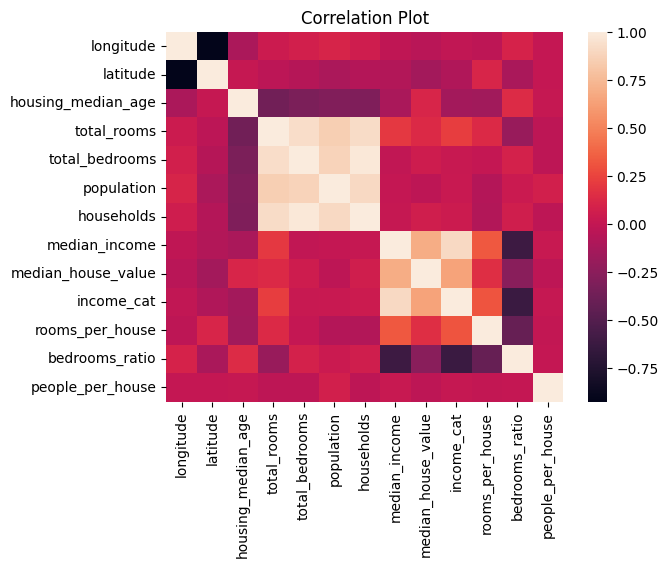

In [51]:
import seaborn as sns 
sns.heatmap(df.select_dtypes(exclude='object').corr()).set_title('Correlation Plot')

In [55]:
train.select_dtypes(include='object').columns

Index(['ocean_proximity'], dtype='object')

In [61]:
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.base import BaseEstimator, TransformerMixin
onehot = OneHotEncoder(handle_unknown='ignore')

onehot.fit(df[['ocean_proximity']])


OneHotEncoder(handle_unknown='ignore')

In [64]:
onehot.get_feature_names_out()
df.drop('ocean_proximity', axis=1)

array(['ocean_proximity_<1H OCEAN', 'ocean_proximity_INLAND',
       'ocean_proximity_ISLAND', 'ocean_proximity_NEAR BAY',
       'ocean_proximity_NEAR OCEAN'], dtype=object)

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,income_cat,rooms_per_house,bedrooms_ratio,people_per_house
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,5,6.984127,0.146591,2.555556
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,5,6.238137,0.155797,2.109842
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,5,8.288136,0.129516,2.802260
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,4,5.817352,0.184458,2.547945
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,3,6.281853,0.172096,2.181467
...,...,...,...,...,...,...,...,...,...,...,...,...,...
20635,-121.09,39.48,25.0,1665.0,374.0,845.0,330.0,1.5603,78100.0,2,5.045455,0.224625,2.560606
20636,-121.21,39.49,18.0,697.0,150.0,356.0,114.0,2.5568,77100.0,2,6.114035,0.215208,3.122807
20637,-121.22,39.43,17.0,2254.0,485.0,1007.0,433.0,1.7000,92300.0,2,5.205543,0.215173,2.325635
20638,-121.32,39.43,18.0,1860.0,409.0,741.0,349.0,1.8672,84700.0,2,5.329513,0.219892,2.123209


In [67]:
onehot_columns = onehot.transform(df[['ocean_proximity']])

array([[0, 0, 0, 1, 0],
       [0, 0, 0, 1, 0],
       [0, 0, 0, 1, 0],
       ...,
       [0, 1, 0, 0, 0],
       [0, 1, 0, 0, 0],
       [0, 1, 0, 0, 0]])

In [70]:
df[onehot.get_feature_names_out()] = onehot_columns.toarray().astype(int)

In [71]:
df

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity,income_cat,rooms_per_house,bedrooms_ratio,people_per_house,ocean_proximity_<1H OCEAN,ocean_proximity_INLAND,ocean_proximity_ISLAND,ocean_proximity_NEAR BAY,ocean_proximity_NEAR OCEAN
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY,5,6.984127,0.146591,2.555556,0,0,0,1,0
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY,5,6.238137,0.155797,2.109842,0,0,0,1,0
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY,5,8.288136,0.129516,2.802260,0,0,0,1,0
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY,4,5.817352,0.184458,2.547945,0,0,0,1,0
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY,3,6.281853,0.172096,2.181467,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20635,-121.09,39.48,25.0,1665.0,374.0,845.0,330.0,1.5603,78100.0,INLAND,2,5.045455,0.224625,2.560606,0,1,0,0,0
20636,-121.21,39.49,18.0,697.0,150.0,356.0,114.0,2.5568,77100.0,INLAND,2,6.114035,0.215208,3.122807,0,1,0,0,0
20637,-121.22,39.43,17.0,2254.0,485.0,1007.0,433.0,1.7000,92300.0,INLAND,2,5.205543,0.215173,2.325635,0,1,0,0,0
20638,-121.32,39.43,18.0,1860.0,409.0,741.0,349.0,1.8672,84700.0,INLAND,2,5.329513,0.219892,2.123209,0,1,0,0,0


In [73]:
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.base import BaseEstimator, TransformerMixin

class Preprocessor(BaseEstimator, TransformerMixin): 
    # Train our custom preprocessors 
    numerical_columns = ['longitude', 'latitude', 'housing_median_age', 'total_rooms',
       'total_bedrooms', 'population', 'households', 'median_income']
    categorical_columns = ['ocean_proximity']
    
    def fit(self, X, y=None): 

        # Create and fit simple imputer
        self.imputer = SimpleImputer(strategy='median')
        self.imputer.fit(X[self.numerical_columns])
        
        # Create and fit Standard Scaler 
        self.scaler = StandardScaler()
        self.scaler.fit(X[self.numerical_columns]) 
        
        # Create and fit one hot encoder
        self.onehot = OneHotEncoder(handle_unknown='ignore')
        self.onehot.fit(X[self.categorical_columns])
        
        return self 

    def transform(self, X): 
        
        # Apply simple imputer 
        imputed_cols = self.imputer.transform(X[self.numerical_columns])
        onehot_cols = self.onehot.transform(X[self.categorical_columns])
        
        # Copy the df 
        transformed_df = X.copy()
         
        # Apply transformed columns
        transformed_df[self.numerical_columns] = imputed_cols
        transformed_df[self.numerical_columns] = self.scaler.transform(transformed_df[self.numerical_columns])        
        
        # Drop existing categorical columns and replace with one hot equiv
        transformed_df = transformed_df.drop(self.categorical_columns, axis=1) 
        transformed_df[self.onehot.get_feature_names_out()] = onehot_cols.toarray().astype(int)
        
        return transformed_df

In [84]:
preproc = Preprocessor()

df = pd.read_csv('housing2.csv')
df["income_cat"] = pd.cut(df["median_income"],
                               bins=[0., 1.5, 3.0, 4.5, 6., np.inf],
                               labels=[1, 2, 3, 4, 5])

train, test = train_test_split(df, test_size=0.3, stratify=df['income_cat'], random_state=20240417)

In [85]:
X_train = train.drop('median_house_value', axis=1)
y_train = train['median_house_value']
preproc.fit(X_train)
preprocessed_df = preproc.transform(X_train)
preprocessed_df.head()

Preprocessor()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,income_cat,ocean_proximity_<1H OCEAN,ocean_proximity_INLAND,ocean_proximity_ISLAND,ocean_proximity_NEAR BAY,ocean_proximity_NEAR OCEAN
9119,-0.723636,1.691333,1.859908,-0.495041,-0.617497,-0.728593,-0.648757,-0.863695,2,0,1,0,0,0
2023,-1.393375,1.087701,0.191558,-0.671639,-0.615171,-0.416972,-0.692475,-1.227802,2,0,0,0,1,0
12868,-0.483730,-0.311415,-0.444004,-0.583340,-0.454719,-0.092957,-0.425020,-1.078713,2,1,0,0,0,0
3943,-0.868579,1.373140,-0.523449,-0.639202,-0.668655,-0.614391,-0.646185,-0.720700,2,0,1,0,0,0
9538,-1.563308,1.214043,1.462682,-0.251319,-0.357052,-0.331099,-0.319580,-0.160014,3,1,0,0,0,0


In [77]:
from sklearn.pipeline import make_pipeline
from sklearn.linear_model import Ridge
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from xgboost.sklearn import XGBRegressor


pipelines = {
    'ridge': make_pipeline(Preprocessor(), Ridge()), 
    'rf': make_pipeline(Preprocessor(), RandomForestRegressor()), 
    'gb': make_pipeline(Preprocessor(), GradientBoostingRegressor()), 
    'xg': make_pipeline(Preprocessor(), XGBRegressor()), 
}


grid = {
    'ridge':{'ridge__alpha':[0.05, 0.25, 0.5, 1.0]}, 
    'rf':{
        'randomforestregressor__n_estimators':[100,200,300], 
        'randomforestregressor__max_depth':[5,6,7,None]
    },
    'gb':{
        'gradientboostingregressor__n_estimators':[100,200,300], 
        'gradientboostingregressor__max_depth':[5,6,7, None]
    },
    'xg':{
       'xgbregressor__n_estimators':[100,200,300], 
       'xgbregressor__max_depth':[5,6,7,None]
    }
}

In [79]:
RandomForestRegressor??

Init signature:
RandomForestRegressor(
    n_estimators=100,
    *,
    criterion='squared_error',
    max_depth=None,
    min_samples_split=2,
    min_samples_leaf=1,
    min_weight_fraction_leaf=0.0,
    max_features=1.0,
    max_leaf_nodes=None,
    min_impurity_decrease=0.0,
    bootstrap=True,
    oob_score=False,
    n_jobs=None,
    random_state=None,
    verbose=0,
    warm_start=False,
    ccp_alpha=0.0,
    max_samples=None,
    monotonic_cst=None,
)
Source:        
class RandomForestRegressor(ForestRegressor):
    """
    A random forest regressor.

    A random forest is a meta estimator that fits a number of decision tree
    regressors on various sub-samples of the dataset and uses averaging to
    improve the predictive accuracy and control over-fitting.
    Trees in the forest use the best split strategy, i.e. equivalent to passing
    `splitter="best"` to the underlying :class:`~sklearn.tree.DecisionTreeRegressor`.
    The sub-sample size is controlled with the `max_sa

In [ ]:
from sklearn.model_selection import GridSearchCV

fit_models = {}
for algo, pipeline in pipelines.items(): 
    try: 
        print(algo)
        model = GridSearchCV(pipeline, grid[algo], n_jobs=-1, cv=10, scoring='r2')
        model.fit(X_train, y_train) 
        fit_models[algo] = model 
    except Exception as e: 
        print(f'Model {algo} had an error {e}')

In [80]:
fit_models = {}
for algo, pipeline in pipelines.items(): 
    print(pipeline)
    
    # try: 
    #     print(algo)
    #     model = GridSearchCV(pipeline, grid[algo], n_jobs=-1, cv=10, scoring='r2')
    #     model.fit(X_train, y_train) 
    #     fit_models[algo] = model 
    # except Exception as e: 
    #     print(f'Model {algo} had an error {e}')

Pipeline(steps=[('preprocessor', Preprocessor()), ('ridge', Ridge())])
Pipeline(steps=[('preprocessor', Preprocessor()),
                ('randomforestregressor', RandomForestRegressor())])
Pipeline(steps=[('preprocessor', Preprocessor()),
                ('gradientboostingregressor', GradientBoostingRegressor())])
Pipeline(steps=[('preprocessor', Preprocessor()),
                ('xgbregressor',
                 XGBRegressor(base_score=None, booster=None, callbacks=None,
                              colsample_bylevel=None, colsample_bynode=None,
                              colsample_bytree=None, device=None,
                              early_stopping_rounds=None,
                              enable_categorical=False, eval_metric=None,
                              feature_types=None, gamma=None, grow_policy=None,
                              importance_type=None,
                              interaction_constraints=None, learning_rate=None,
                              max_bi

In [86]:
rfr = make_pipeline(Preprocessor(), RandomForestRegressor())

In [87]:
rfr.fit(X_train, y_train)

Pipeline(steps=[('preprocessor', Preprocessor()),
                ('randomforestregressor', RandomForestRegressor())])

In [ ]:
rfr.

In [88]:
X_test = test.drop('median_house_value', axis=1)
y_test = test['median_house_value']

In [93]:
y_train_hat=rfr.predict(X_train)

In [97]:
(y_train_hat-y_train).mean()

139.36405730897104

In [98]:
y_hat=rfr.predict(X_test)

In [99]:
(y_test-y_hat).mean()

-733.8668007105953

In [126]:
import dill
with open('rfr_v1.pkl', 'wb') as f:
    dill.dump(rfr, f)

In [125]:
import sys
print(sys.getsizeof(rfr))


48


In [139]:
options = {}
numerical_columns = ['longitude', 'latitude', 'housing_median_age', 'total_rooms',
       'total_bedrooms', 'population', 'households', 'median_income', ]
for column in numerical_columns:
    options[column] = (X_train[column].min(),  X_train[column].max())
for column in ['ocean_proximity', 'income_cat']:
    options[column] = sorted(X_train[column].unique().tolist())
options

{'longitude': (-124.35, -114.31),
 'latitude': (32.55, 41.95),
 'housing_median_age': (1.0, 52.0),
 'total_rooms': (2.0, 39320.0),
 'total_bedrooms': (1.0, 6445.0),
 'population': (3.0, 28566.0),
 'households': (1.0, 6082.0),
 'median_income': (0.4999, 15.0001),
 'ocean_proximity': ['<1H OCEAN',
  'INLAND',
  'ISLAND',
  'NEAR BAY',
  'NEAR OCEAN'],
 'income_cat': [1, 2, 3, 4, 5]}

In [140]:
import json
with open('options.json', 'w') as f:
    json.dump(options, f)

In [138]:
options

{'longitude': (-124.35, -114.31),
 'latitude': (32.55, 41.95),
 'housing_median_age': (1.0, 52.0),
 'total_rooms': (2.0, 39320.0),
 'total_bedrooms': (1.0, 6445.0),
 'population': (3.0, 28566.0),
 'households': (1.0, 6082.0),
 'median_income': (0.4999, 15.0001),
 'income_cat': (1, 5),
 'ocean_proximity': ['<1H OCEAN',
  'INLAND',
  'ISLAND',
  'NEAR BAY',
  'NEAR OCEAN']}

In [142]:
y_hat[0]

278710.01